In [2]:
import plotly.express as px
import pandas as pd
import json
import os
import plotly
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)  

import matplotlib as plt
import numpy as np
import seaborn as sns

In [3]:
df = pd.read_csv("../data/carbon-market_and_co2-emissions.csv.zip", sep=",")

In [4]:
df.head(1)

,Unnamed: 0,project_id,credits_issued,credits_retired,registry_issued_credits,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,first_year_of_project,project_type,year,credits_remaining,co2_emitted
0,0,ACR102,0,0,0,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,not_available,North America,United States,OREGON,2003.0,Industrial Gas Substitution,1996,0,5283110.0


In [13]:
df_co2 = df[['country','year', 'co2_emitted']].groupby(['country', 'year']).min().reset_index()
df_co2.head()

,country,year,co2_emitted
0,Argentina,1996,126560.0
1,Argentina,1997,127320.0
2,Argentina,1998,133170.0
3,Argentina,1999,134190.0
4,Argentina,2000,131910.0


In [23]:
df_co2.to_csv("../data/co2-emissions.csv",index=False)

In [10]:
df[df['country' ]== 'Argentina']

,Unnamed: 0,project_id,credits_issued,credits_retired,registry_issued_credits,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,first_year_of_project,project_type,year,credits_remaining,co2_emitted
1984,1984,GS7737,0,0,0,GOLD,No,Gold Standard Certified Project,Renewable Energy,Solar - Centralized,Reduction,ACM0002 Grid-connected electricity generation ...,South America,Argentina,not_available,2019.0,SOLAR_THERMAL_ELECTRICITY,1996,0,126560.0
2127,2127,VCS1111,0,0,0,VCS,No,Registered,Renewable Energy,Wind,Reduction,ACM0002,South America,Argentina,not_available,2012.0,Energy industries (renewable/non-renewable sou...,1996,0,126560.0
2583,2583,VCS1820,0,0,0,VCS,No,Registered,Renewable Energy,Wind,Reduction,ACM0002,South America,Argentina,not_available,2018.0,Energy industries (renewable/non-renewable sou...,1996,0,126560.0
2600,2600,VCS185,0,0,0,VCS,No,Registered,Renewable Energy,Biomass,Reduction,AM0036,South America,Argentina,not_available,2007.0,Energy industries (renewable/non-renewable sou...,1996,0,126560.0
2622,2622,VCS188,0,0,0,VCS,No,Registered,Waste Management,Methane Recovery in Wastewater,Reduction,AMS-III.I.,South America,Argentina,not_available,2007.0,Waste handling and disposal,1996,0,126560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90983,90983,VCS1820,0,34429,0,VCS,No,Registered,Renewable Energy,Wind,Reduction,ACM0002,South America,Argentina,not_available,2018.0,Energy industries (renewable/non-renewable sou...,2021,0,NaN
91000,91000,VCS185,0,14376,0,VCS,No,Registered,Renewable Energy,Biomass,Reduction,AM0036,South America,Argentina,not_available,2007.0,Energy industries (renewable/non-renewable sou...,2021,0,NaN
91022,91022,VCS188,0,0,0,VCS,No,Registered,Waste Management,Methane Recovery in Wastewater,Reduction,AMS-III.I.,South America,Argentina,not_available,2007.0,Waste handling and disposal,2021,0,NaN
91085,91085,VCS1987,0,1800,0,VCS,No,Registered,Renewable Energy,Wind,Reduction,ACM0002,South America,Argentina,not_available,2018.0,Energy industries (renewable/non-renewable sou...,2021,0,NaN


In [18]:
#df[['region','year', 'co2_emitted']].groupby(['region','year']).sum().reset_index()
px.line(
    df[['country','year', 'co2_emitted']].groupby(['country','year']).min().reset_index(),
    x="year",
    y="co2_emitted",   
    color='country'
)

In [20]:
df.columns

Index(['Unnamed: 0', 'project_id', 'credits_issued', 'credits_retired',
       'registry_issued_credits', 'voluntary_registry', 'arb_project',
       'voluntary_status', 'scope', 'type', 'reduction_removal',
       'methodology_protocol', 'region', 'country', 'state',
       'first_year_of_project', 'project_type', 'year', 'credits_remaining',
       'co2_emitted'],
      dtype='object')

In [26]:
pivoted_df = pd.pivot_table(data=df, index='scope', columns='year', values='co2_emitted')

In [60]:
px.scatter(
    df,
    x="co2_emitted",
    y="credits_issued",
    color="region",
)

In [55]:
cols_names = ['voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type', 'co2_emitted']
cols_names.sort()
col_items = {i[0]: i[1] for i in list(zip(range(len(cols_names)), cols_names))}

In [56]:
col_items

{0: 'co2_emitted',
 1: 'country',
 2: 'project_type',
 3: 'reduction_removal',
 4: 'region',
 5: 'scope',
 6: 'type',
 7: 'voluntary_registry',
 8: 'voluntary_status'}

In [57]:
df.columns

Index(['Unnamed: 0', 'project_id', 'credits_issued', 'credits_retired',
       'registry_issued_credits', 'voluntary_registry', 'arb_project',
       'voluntary_status', 'scope', 'type', 'reduction_removal',
       'methodology_protocol', 'region', 'country', 'state',
       'first_year_of_project', 'project_type', 'year', 'credits_remaining',
       'co2_emitted'],
      dtype='object')

In [84]:
fig = px.box(df, x="region", y="co2_emitted")
fig.update_yaxes(type="log")
fig.show()

In [80]:
fig = px.box(df, x="scope", y="co2_emitted",  height=600)
fig.update_yaxes(type="log")
fig.show()

In [24]:
df2 = pd.read_csv("../data/co2-emissions.csv")

<AxesSubplot:xlabel='year'>

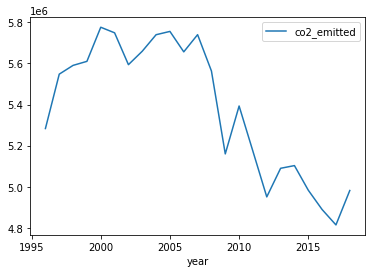

In [35]:
df2[df2['country']== 'United States'].plot.line(x='year', y='co2_emitted')

In [40]:
df3 = df.drop(columns=['Unnamed: 0', 'co2_emitted'])


In [41]:
df3.to_csv("../data/carbon-market.csv", index=False)

In [42]:
df4 = pd.read_csv("../data/carbon-market.csv.zip")

In [43]:
df4

,project_id,credits_issued,credits_retired,registry_issued_credits,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,first_year_of_project,project_type,year,credits_remaining
0,ACR102,0,0,0,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,not_available,North America,United States,OREGON,2003.0,Industrial Gas Substitution,1996,0
1,ACR103,0,0,0,ACR,No,Completed,Agriculture,Manure Methane Digester,Reduction,not_available,North America,United States,CALIFORNIA,2003.0,Livestock Waste Management,1996,0
2,ACR105,0,0,0,ACR,No,Completed,Forestry & Land Use,Afforestation/Reforestation,Impermanent Removal,not_available,South America,Brazil,Roraima,2011.0,Forest Carbon,1996,0
3,ACR106,0,0,0,ACR,No,Completed,Waste Management,Landfill Methane,Reduction,not_available,North America,United States,ILLINOIS,2006.0,Landfill Gas Capture & Combustion,1996,0
4,ACR107,0,0,0,ACR,No,Completed,Industrial Manufacturing,Fuel Switching,Reduction,not_available,South America,Bolivia,Nor Ciniti,2005.0,Fuel Switching,1996,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91931,VCS995,0,23605,0,VCS,No,Registered,Forestry & Land Use,Afforestation/Reforestation,Impermanent Removal,AR-AMS0001,Sub Saharan Africa,Uganda,not_available,2012.0,Agriculture Forestry and Other Land Use,2021,0
91932,VCS996,0,5462,0,VCS,No,Registered,Forestry & Land Use,Afforestation/Reforestation,Impermanent Removal,AR-AMS0001,Sub Saharan Africa,Kenya,not_available,2012.0,Agriculture Forestry and Other Land Use,2021,0
91933,VCS998,0,0,0,VCS,No,Registered,Household & Community,Lighting,Reduction,AMS-II.J.,South East Asia,Vietnam,not_available,2012.0,Energy demand,2021,0
91934,VCSOPR10,0,0,0,VCS,Yes,Transfer to another GHG program,Forestry & Land Use,Improved Forest Management,Mixed,not_available,North America,United States,MISSOURI,2017.0,not_available,2021,0
